<a href="https://colab.research.google.com/github/Tharunkunamalla/Edunet_Project_Cracters_Detection/blob/main/Edunet_Project_Craters_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Step 1: Clone YOLOv5 repo
!git clone https://github.com/ultralytics/yolov5
%cd yolov5

# Step 2: Install dependencies
!pip install -r requirements.txt --quiet

# Step 3: Upload model and data
from google.colab import files
print("📤 Upload your best.pt")
model_upload = files.upload()

print("📤 Upload your test zip")
zip_upload = files.upload()



Cloning into 'yolov5'...
remote: Enumerating objects: 17511, done.
remote: Counting objects: 100% (20/20), done.
remote: Compressing objects: 100% (20/20), done.
remote: Total 17511 (delta 5), reused 0 (delta 0), pack-reused 17491 (from 3)
Receiving objects: 100% (17511/17511), 16.60 MiB | 17.17 MiB/s, done.
Resolving deltas: 100% (11993/11993), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 52.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 33.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 37.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 9.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.0 MB/s eta 0

Saving best.pt to best.pt
📤 Upload your test zip


Saving craters.zip to craters.zip


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
detect: weights=['/content/yolov5/best.pt'], source=/content/test/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-422-g2540fd4c Python-3.11.13 torch-2.6.0+cu124 CPU

Fusing layers... 
Model summary: 378 layers, 35248920 parameters, 0 gradients, 48.9 GFLOPs
image 1/19 /content/test/test/

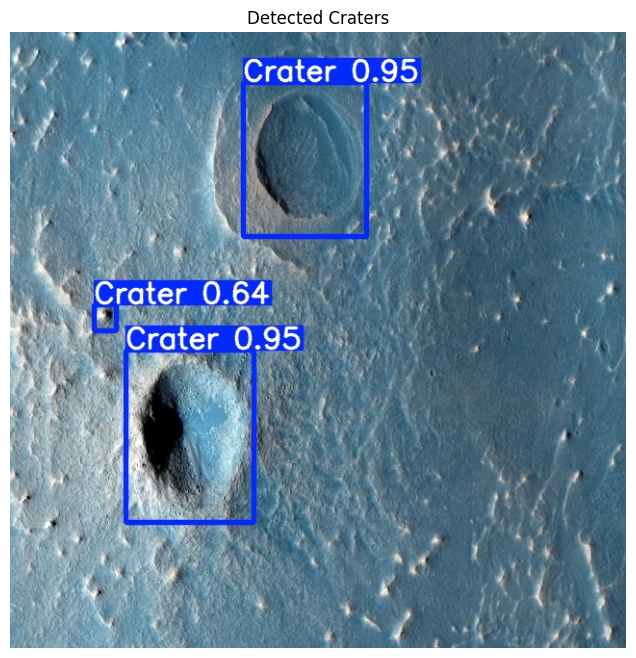

In [2]:
import zipfile, os

# Step 4: Extract test images
zip_path = list(zip_upload.keys())[0]
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall('/content/test')

# Step 5: Run inference using YOLOv5's detect.py
!python detect.py --weights /content/yolov5/{list(model_upload.keys())[0]} \ #Here instead of best.pt it can directly train model with yolov5
                  --source /content/test/test/images  \
                  --conf 0.4 \
                  --save-txt \
                  --save-conf

# Step 6: View results
import cv2
import matplotlib.pyplot as plt
import os

# Find output image from the latest exp folder
output_dir = sorted(os.listdir("runs/detect"))[-1]  #So it shows the first file from the directory
output_img_path = f"runs/detect/{output_dir}/" + os.listdir(f"runs/detect/{output_dir}")[0] #This line of code picks the first image file (alphabetically) from the output folder

img = cv2.imread(output_img_path)
if img is None:
    print("❌ Image not found or not saved correctly!")
else:
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(8, 8))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.title("Detected Craters")
    plt.show()


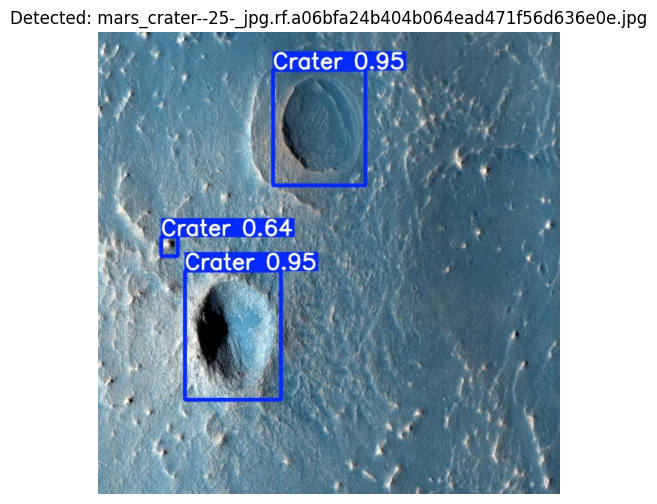

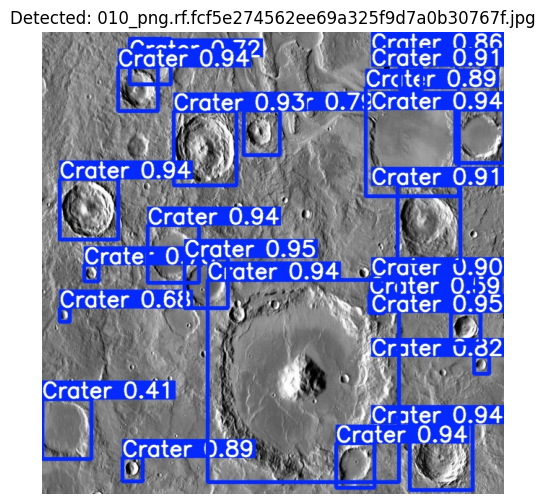

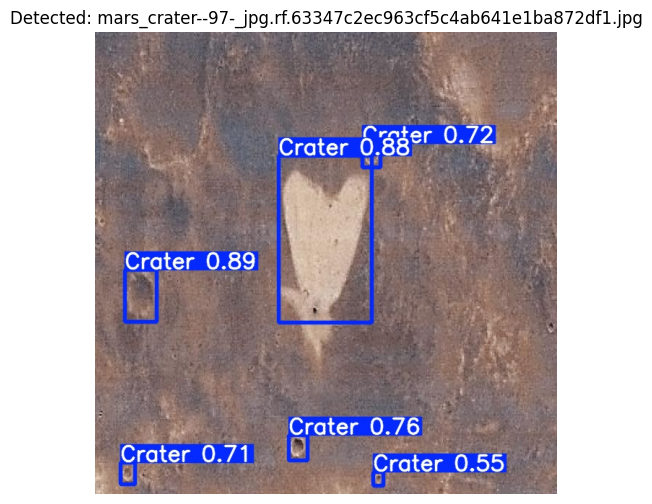

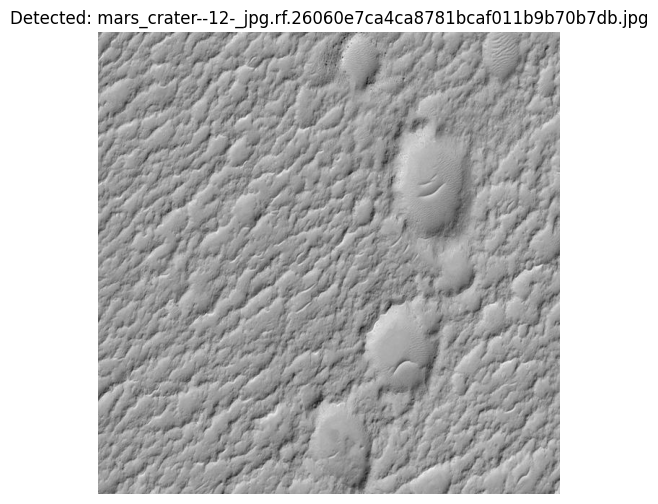

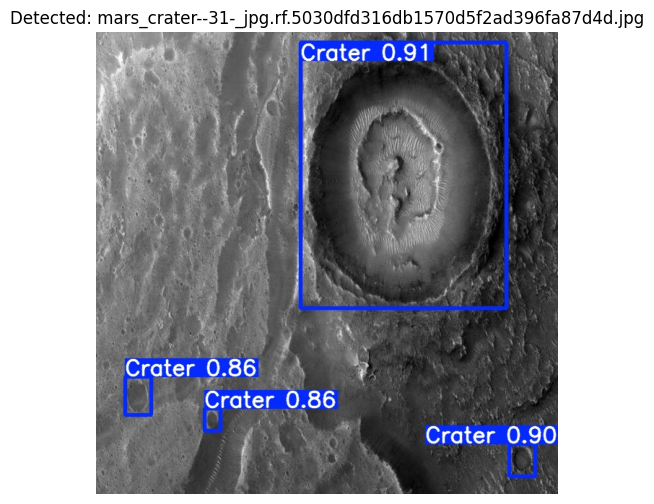

...

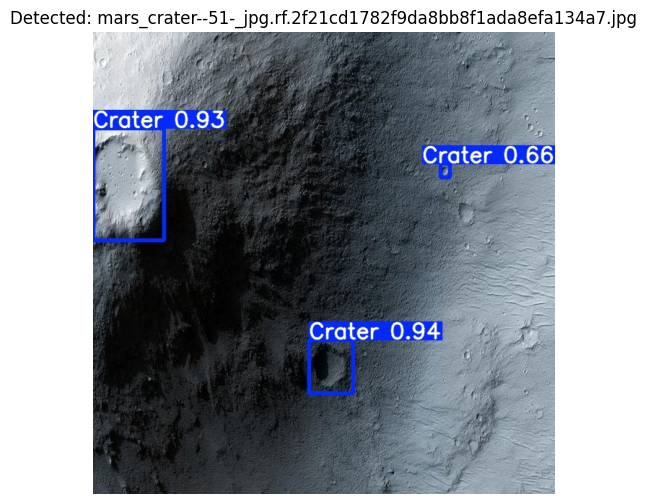

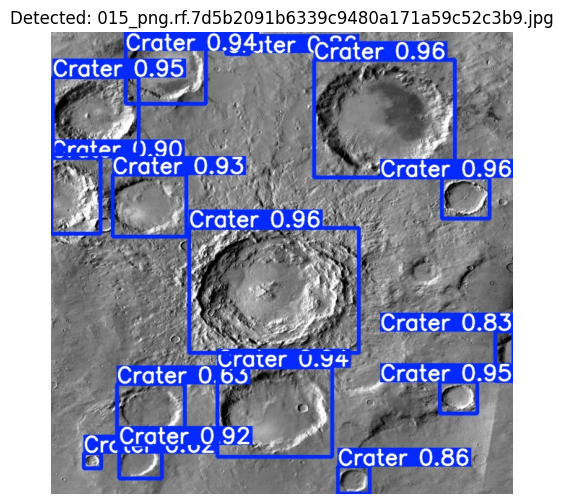

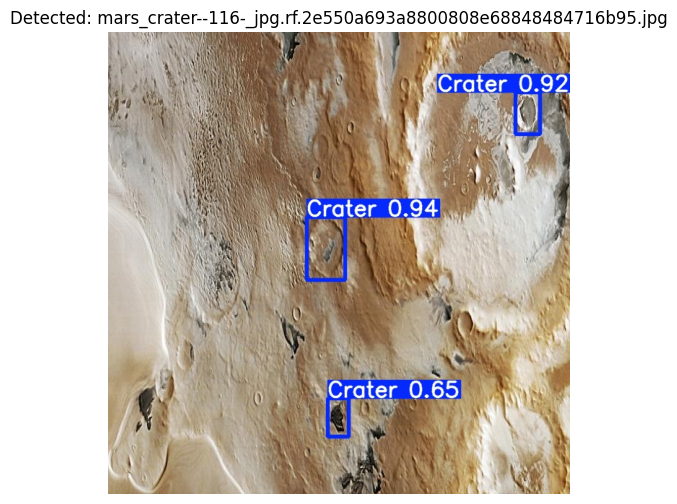

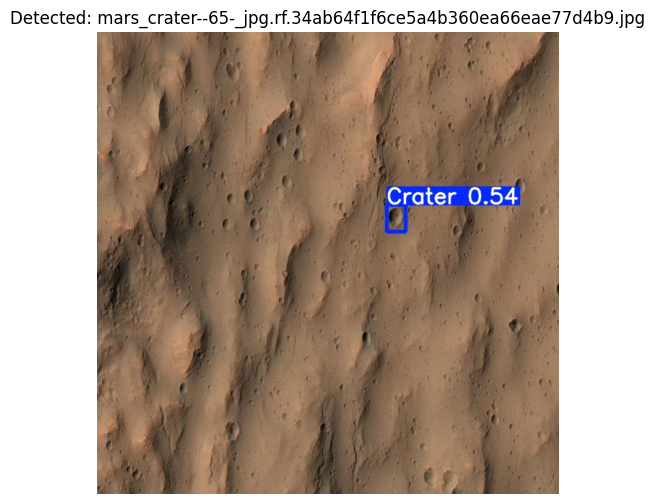

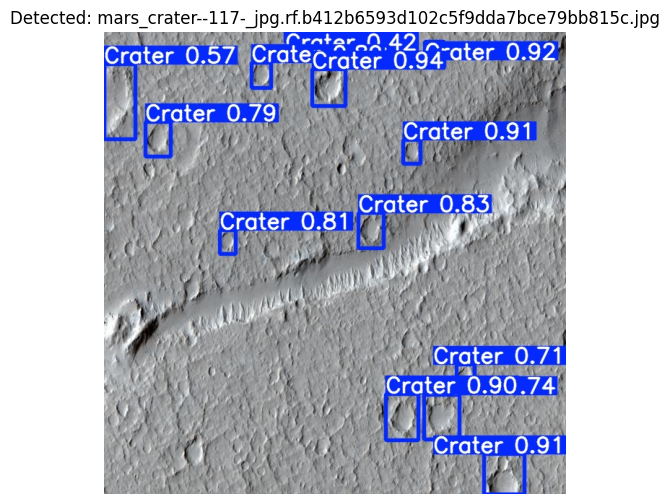

In [3]:
import os
import cv2
import matplotlib.pyplot as plt

# Locate latest exp folder
output_base = "/content/yolov5/runs/detect"
exp_folder = sorted(os.listdir(output_base))[-1]
output_folder = os.path.join(output_base, exp_folder)

# Get all image paths
image_paths = [os.path.join(output_folder, f) for f in os.listdir(output_folder) if f.lower().endswith(('.jpg', '.png'))]

# Display all results
for img_path in image_paths:
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(6, 6))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.title(f"Detected: {os.path.basename(img_path)}")
    plt.show()
